# Bike Safety EPJ model in Washington DC

Should get:
* accident severity
* accident distance from intersection
* road characteristics:
    * max speed
    * number of lanes
    * width
    * curvature
    * type of road
    * bike lane type
    * traffic volume
    * cycling volume

check slack for data inputs and outputs

## Retain relevant OSM
Use OSM line info (only when highway is not Null)

In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point

In [3]:
highways = gpd.read_file(r'..\dc_lines_osm.geojson')
highways

,osm_id,name,highway,waterway,aerialway,barrier,man_made,z_order,other_tags,geometry
0,4681186,None,service,None,None,None,None,0,None,"LINESTRING (-77.10826 38.93574, -77.10826 38.9..."
1,4725152,Texas Avenue Southeast,secondary,None,None,None,None,6,"""HFCS""=>""Collector"",""lanes""=>""1"",""name:etymolo...","LINESTRING (-76.93866 38.88917, -76.93838 38.8..."
2,5967442,Allan Road,residential,None,None,None,None,3,"""lcn""=>""yes"",""maxspeed""=>""20 mph"",""sidewalk:bo...","LINESTRING (-77.10231 38.95533, -77.10227 38.9..."
3,5968135,Summerfield Road,residential,None,None,None,None,3,"""lane_markings""=>""no"",""surface""=>""asphalt""","LINESTRING (-77.07191 38.97399, -77.07156 38.9..."
4,5968393,Albemarle Street,residential,None,None,None,None,3,"""maxspeed""=>""20 mph"",""sidewalk""=>""no"",""surface...","LINESTRING (-77.10253 38.9479, -77.10264 38.94..."
...,...,...,...,...,...,...,...,...,...,...
88450,1445836671,None,service,None,None,None,None,0,"""access""=>""private""","LINESTRING (-77.01518 38.90502, -77.01525 38.9..."
88451,1445836672,New York Avenue Northwest,trunk,None,None,None,None,8,"""HFCS""=>""Principal Arterial"",""NHS""=>""yes"",""des...","LINESTRING (-77.01586 38.905, -77.01602 38.904..."
88452,1445943511,None,service,None,None,None,None,0,None,"LINESTRING (-77.0239 38.91957, -77.02382 38.91..."
88453,1445943512,None,service,None,None,None,None,0,None,"LINESTRING (-77.02371 38.91957, -77.02371 38.9..."


In [4]:
highways = highways.dropna(subset=['highway'])
highways

,osm_id,name,highway,waterway,aerialway,barrier,man_made,z_order,other_tags,geometry
0,4681186,None,service,None,None,None,None,0,None,"LINESTRING (-77.10826 38.93574, -77.10826 38.9..."
1,4725152,Texas Avenue Southeast,secondary,None,None,None,None,6,"""HFCS""=>""Collector"",""lanes""=>""1"",""name:etymolo...","LINESTRING (-76.93866 38.88917, -76.93838 38.8..."
2,5967442,Allan Road,residential,None,None,None,None,3,"""lcn""=>""yes"",""maxspeed""=>""20 mph"",""sidewalk:bo...","LINESTRING (-77.10231 38.95533, -77.10227 38.9..."
3,5968135,Summerfield Road,residential,None,None,None,None,3,"""lane_markings""=>""no"",""surface""=>""asphalt""","LINESTRING (-77.07191 38.97399, -77.07156 38.9..."
4,5968393,Albemarle Street,residential,None,None,None,None,3,"""maxspeed""=>""20 mph"",""sidewalk""=>""no"",""surface...","LINESTRING (-77.10253 38.9479, -77.10264 38.94..."
...,...,...,...,...,...,...,...,...,...,...
88450,1445836671,None,service,None,None,None,None,0,"""access""=>""private""","LINESTRING (-77.01518 38.90502, -77.01525 38.9..."
88451,1445836672,New York Avenue Northwest,trunk,None,None,None,None,8,"""HFCS""=>""Principal Arterial"",""NHS""=>""yes"",""des...","LINESTRING (-77.01586 38.905, -77.01602 38.904..."
88452,1445943511,None,service,None,None,None,None,0,None,"LINESTRING (-77.0239 38.91957, -77.02382 38.91..."
88453,1445943512,None,service,None,None,None,None,0,None,"LINESTRING (-77.02371 38.91957, -77.02371 38.9..."


In [5]:
#see what the highway types are
highways['highway'].value_counts()

highway
footway           44617
service           17454
residential        5211
primary            2971
secondary          2162
cycleway           2054
tertiary           1979
steps              1540
path                807
motorway            527
motorway_link       468
unclassified        449
trunk               418
primary_link        330
proposed            129
pedestrian          111
secondary_link       83
trunk_link           53
tertiary_link        52
living_street        51
bridleway            45
track                44
corridor             33
construction         26
elevator              6
services              1
Name: count, dtype: int64

Remove:
* footway (unless "bicycle"="yes" or "cycleway"="yes")
* steps
* elevator
* path (if "bicycle"="no" or "cycleway"="no")
* proposed
* pedestrian (unless "bicycle"="yes", "bicycle"="designated", "cycleway"="track")
* bridleway

for anything with '_link' remove that

In [6]:
highways = highways[~((highways['highway'] == 'footway') & ~(highways['other_tags'].str.contains('"bicycle"=>"yes"', na=False) |
                                                            highways['other_tags'].str.contains('"cycleway"=>"yes"', na=False)))]
highways = highways[highways['highway']!= 'steps']
highways = highways[~((highways['highway'] == 'path') & (highways['other_tags'].str.contains('"bicycle"=>"no"', na=False) | highways['other_tags'].str.contains('"cycleway"=>"no"', na=False)))]
highways = highways[highways['highway']!= 'proposed']
highways = highways[highways['highway']!= 'bridleway']
highways = highways[~((highways['highway'] == 'pedestrian') & ~(highways['other_tags'].str.contains('"bicycle"=>"yes"', na=False) |
                                                            highways['other_tags'].str.contains('"cycleway"=>"yes"', na=False) |
                                                            highways['other_tags'].str.contains('"cycleway"=>"track"', na=False) |
                                                            highways['other_tags'].str.contains('"bicycle"=>"designated"', na=False)))]
highways.to_file('highways_relevant.geojson')


In [7]:
#look at tags
tags = {}
for it, row in highways.iterrows():
    if row['other_tags'] is not None:
        for s in row['other_tags'].split(','):
            curr =  s.split('=>')[0]
            if curr not in tags.keys():
                tags[curr] = 0
            else:
                tags[curr] = tags[curr] +1

In [8]:
from collections import Counter
tags_counter = Counter(tags)
tags_counter.most_common(100)

[('"surface"', 18405),
 ('"oneway"', 10759),
 ('"lanes"', 9866),
 ('"service"', 8590),
 ('"HFCS"', 7131),
 ('"source:HFCS"', 6470),
 ('"tiger:cfcc"', 5003),
 ('"tiger:county"', 4987),
 (' DC"', 4737),
 ('"maxspeed"', 4606),
 ('"tiger:name_type"', 4468),
 ('"tiger:name_base"', 4465),
 ('"tiger:name_direction_suffix"', 4240),
 ('"tiger:zip_left"', 3719),
 ('"tiger:zip_right"', 3577),
 ('"bicycle"', 3451),
 ('"tiger:reviewed"', 3327),
 ('"access"', 3216),
 ('"name:etymology:wikidata"', 3092),
 ('"sidewalk"', 3062),
 ('"foot"', 3052),
 ('"lane_markings"', 2612),
 ('"lit"', 2363),
 ('"sidewalk:both"', 1723),
 ('"cycleway:right"', 1529),
 ('"cycleway"', 1512),
 ('"NHS"', 1468),
 ('"sidewalk:right"', 1454),
 ('"sidewalk:left"', 1401),
 ('"turn:lanes"', 1345),
 ('"lanes:forward"', 1264),
 ('"lanes:backward"', 1262),
 ('"ref"', 1134),
 ('"hgv"', 1020),
 ('"crossing"', 960),
 ('"crossing:markings"', 915),
 ('"parking:both"', 913),
 ('"motor_vehicle"', 902),
 ('"layer"', 846),
 ('"cycleway:left"'

In [18]:
for t in tags:
    print(t)

"HFCS"
"lanes"
"name:etymology:wikidata"
"oneway"
"sidewalk"
"source:HFCS"
"lcn"
"maxspeed"
"sidewalk:both"
"surface"
"lane_markings"
"description"
"ref"
"sidewalk:left"
"sidewalk:right"
"tiger:cfcc"
"bicycle"
"tiger:county"
 MD"
"tiger:name_base"
"tiger:name_type"
"tiger:zip_left"
"tiger:zip_right"
"NHS"
"lit"
"expressway"
"noref"
"oneway:conditional"
"tiger:separated"
"tiger:source"
"tiger:tlid"
"tiger:upload_uuid"
"parking:left"
"parking:right"
"parking:right:orientation"
"tiger:name_base_1"
"tiger:reviewed"
"tiger:zip_left_1"
"hgv"
"old_ref"
"source:width"
"width"
"cycleway"
"shoulder"
"tiger:name_direction_suffix"
"tiger:name_type_1"
"cycleway:right"
"cycleway:right:buffer"
"parking:both"
"parking:both:orientation"
"access"
 DC"
"motor_vehicle"
"tiger:name_direction_prefix"
"destination"
"foot"
"turn:lanes"
"destination:lanes"
"bridge"
"layer"
"service"
"destination:ref"
"source:name"
"fixme:tigerking"
"maxheight"
"tunnel"
"bicycle_road"
"bridge:name"
"heritage"
"heritage:operator

In [10]:
tags['"cycleway:oneway"']

116

In [11]:
potentially_useful = ['"HFCS"', '"lanes"', '"oneway"', '"maxspeed"', '"bicycle"', '"NHS"', '"expressway"', '"oneway:conditional"', 
        '"tiger:separated"', '"parking:left"', '"parking:right"', '"parking:right:orientation"', '"source:width"', 
        '"cycleway"', '"shoulder"', '"cycleway:right"', '"cycleway:right:buffer"', '"parking:both"', 
        '"parking:both:orientation"', '"access"',  '"motor_vehicle"','"foot"',  '"turn:lanes"', '"bridge"',
       '"tunnel"', '"bicycle_road"', '"bridge:name"', '"lanes:backward"', '"lanes:forward"', '"turn:lanes:backward"',
        '"turn:lanes:forward"', '"cycleway:left"','"cycleway:right:lane"', '"cycleway:both"','"parking:lane:right"',
         '"cycleway:both:lane"','"change:lanes:backward"', '"change:lanes:forward"', '"cycleway:left:lane"',
         '"cycleway:left:oneway"', '"parking"', '"cycleway:lane"','"cycleway:lanes"', '"lanes:bus"',  '"parking:lane:left"', 
        '"cycleway:oneway"', '"cycleway:separation"', '"bicycle:lanes"', '"surface"', '"cycleway:surface"' ]
print(len(potentially_useful))
keep = []
for t in potentially_useful:
    if tags[t] >=25:
        keep.append(t)
print(len(keep))
keep

50
39


['"HFCS"',
 '"lanes"',
 '"oneway"',
 '"maxspeed"',
 '"bicycle"',
 '"NHS"',
 '"expressway"',
 '"oneway:conditional"',
 '"parking:left"',
 '"parking:right"',
 '"parking:right:orientation"',
 '"source:width"',
 '"cycleway"',
 '"shoulder"',
 '"cycleway:right"',
 '"cycleway:right:buffer"',
 '"parking:both"',
 '"parking:both:orientation"',
 '"access"',
 '"motor_vehicle"',
 '"foot"',
 '"turn:lanes"',
 '"bridge"',
 '"tunnel"',
 '"bridge:name"',
 '"lanes:backward"',
 '"lanes:forward"',
 '"turn:lanes:backward"',
 '"turn:lanes:forward"',
 '"cycleway:left"',
 '"cycleway:right:lane"',
 '"cycleway:both"',
 '"parking:lane:right"',
 '"cycleway:both:lane"',
 '"cycleway:left:lane"',
 '"cycleway:left:oneway"',
 '"cycleway:oneway"',
 '"cycleway:separation"',
 '"surface"']

In [13]:
highways.to_file(r'..\osm_highway_limited.geojson')

In [14]:
highways = highways.reindex(columns=highways.columns.tolist() + keep, fill_value=np.nan)
highways

,osm_id,name,highway,waterway,aerialway,barrier,man_made,z_order,other_tags,geometry,...,"""cycleway:left""","""cycleway:right:lane""","""cycleway:both""","""parking:lane:right""","""cycleway:both:lane""","""cycleway:left:lane""","""cycleway:left:oneway""","""cycleway:oneway""","""cycleway:separation""","""surface"""
0,4681186,None,service,None,None,None,None,0,None,"LINESTRING (-77.10826 38.93574, -77.10826 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4725152,Texas Avenue Southeast,secondary,None,None,None,None,6,"""HFCS""=>""Collector"",""lanes""=>""1"",""name:etymolo...","LINESTRING (-76.93866 38.88917, -76.93838 38.8...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5967442,Allan Road,residential,None,None,None,None,3,"""lcn""=>""yes"",""maxspeed""=>""20 mph"",""sidewalk:bo...","LINESTRING (-77.10231 38.95533, -77.10227 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5968135,Summerfield Road,residential,None,None,None,None,3,"""lane_markings""=>""no"",""surface""=>""asphalt""","LINESTRING (-77.07191 38.97399, -77.07156 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5968393,Albemarle Street,residential,None,None,None,None,3,"""maxspeed""=>""20 mph"",""sidewalk""=>""no"",""surface...","LINESTRING (-77.10253 38.9479, -77.10264 38.94...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88450,1445836671,None,service,None,None,None,None,0,"""access""=>""private""","LINESTRING (-77.01518 38.90502, -77.01525 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88451,1445836672,New York Avenue Northwest,trunk,None,None,None,None,8,"""HFCS""=>""Principal Arterial"",""NHS""=>""yes"",""des...","LINESTRING (-77.01586 38.905, -77.01602 38.904...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88452,1445943511,None,service,None,None,None,None,0,None,"LINESTRING (-77.0239 38.91957, -77.02382 38.91...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88453,1445943512,None,service,None,None,None,None,0,None,"LINESTRING (-77.02371 38.91957, -77.02371 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
i = 0
for it, row in highways.iterrows():
    if i%50 == 0:
        print(i)
    i = i + 1
    if row['other_tags'] is not None:
        for s in row['other_tags'].split(','):
            curr =  s.split('=>')[0]
            if curr in keep:
                highways.loc[it, curr] = s.split('=>')[1]
    

0
50


C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"Collector"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]
C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"1"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]
C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"yes"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.

100
150
200
250
300
350
400
450
500
550
600
650


C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"parallel"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]
C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"advisory"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]


700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
2050
2100
2150
2200
2250
2300
2350


C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"exclusive"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]
C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"-1"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]


2400
2450
2500
2550
2600
2650
2700
2750
2800
2850
2900
2950
3000
3050
3100
3150
3200
3250
3300
3350
3400
3450
3500
3550
3600
3650
3700
3750
3800
3850
3900
3950
4000
4050
4100
4150
4200
4250
4300
4350
4400
4450
4500
4550
4600
4650
4700
4750
4800
4850
4900
4950
5000
5050
5100
5150
5200
5250
5300
5350
5400
5450
5500
5550
5600
5650
5700
5750
5800
5850
5900
5950
6000
6050
6100
6150
6200
6250
6300
6350
6400
6450
6500
6550
6600
6650
6700
6750
6800
6850
6900
6950
7000
7050
7100
7150
7200
7250
7300
7350
7400
7450
7500
7550
7600
7650
7700
7750
7800
7850
7900
7950
8000
8050
8100
8150
8200
8250
8300
8350
8400
8450
8500
8550
8600
8650
8700
8750
8800
8850
8900
8950
9000
9050
9100
9150
9200
9250
9300
9350
9400
9450
9500
9550
9600
9650
9700
9750
9800
9850
9900
9950
10000
10050
10100
10150
10200
10250
10300
10350
10400
10450
10500
10550
10600
10650
10700
10750
10800
10850
10900
10950
11000
11050
11100
11150
11200
11250
11300
11350
11400
11450
11500
11550
11600
11650
11700
11750
11800
11850
11900
11950


C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"yes"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]


24900
24950
25000
25050
25100
25150
25200
25250
25300
25350
25400
25450
25500
25550
25600
25650
25700
25750
25800
25850
25900
25950
26000
26050
26100
26150
26200
26250
26300
26350
26400
26450
26500
26550
26600
26650
26700
26750
26800
26850
26900
26950
27000
27050
27100
27150
27200
27250
27300
27350
27400
27450
27500
27550
27600
27650
27700
27750
27800
27850
27900
27950
28000
28050
28100
28150
28200
28250
28300
28350
28400
28450
28500
28550
28600
28650
28700
28750
28800
28850
28900
28950
29000
29050
29100
29150
29200
29250
29300
29350
29400
29450
29500
29550
29600
29650
29700
29750
29800
29850
29900
29950
30000
30050
30100
30150
30200
30250
30300
30350
30400
30450
30500
30550
30600
30650
30700
30750
30800
30850
30900
30950
31000
31050
31100
31150


C:\Users\cle9a\AppData\Local\Temp\ipykernel_11144\2897677920.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '"flex_post"' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  highways.loc[it, curr] = s.split('=>')[1]


31200
31250
31300
31350
31400
31450
31500
31550
31600
31650
31700
31750
31800
31850
31900
31950
32000
32050
32100
32150
32200
32250
32300
32350
32400
32450
32500
32550
32600
32650
32700
32750
32800
32850
32900
32950
33000
33050
33100
33150
33200
33250
33300
33350
33400
33450
33500
33550
33600
33650
33700
33750
33800
33850
33900
33950
34000
34050
34100
34150
34200
34250
34300
34350
34400
34450
34500
34550
34600
34650
34700
34750
34800
34850
34900
34950
35000
35050
35100
35150
35200
35250
35300
35350
35400
35450
35500
35550
35600
35650
35700
35750
35800


In [16]:
highways[['"maxspeed"']].value_counts()

"maxspeed"
"25 mph"      2147
"15 mph"       663
"30 mph"       643
"20 mph"       343
"40 mph"       222
"35 mph"       174
"50 mph"       122
"45 mph"       103
"10 mph"        84
"5 mph"         52
"55 mph"        28
"65 mph"         9
"24.14"          5
"30"             4
"15"             3
"5"              3
"20"             1
"24 mph"         1
Name: count, dtype: int64

In [17]:
highways.to_file(r'..\osm_highway_limited_wCols.geojson')

## Get edges and nodes
This will let use treat the road network as a graph as well as give us the road segments (as defined by a line between intersections) we need. This does mean that if a cyclelane is a separate line in OSM, it will be it's own road segment.

First, merge all the lines together. This means we'll lose the OSM info. Not sure if it makes sense to join the osm info back to the line segments or just match an accident point to a line segment and well as an OSM entry. OSM roads aren't alwasy broken up at intersections, hence why we need to work with the geomtery.

In [ ]:
highways = gpd.read_file(r'..\osm_highway_limited.geojson')
highways

In [19]:
#merge all roads into multilnestring
all_roads = highways['geometry'].union_all()
print(all_roads.length)
all_roads

41.190950496017095


In [20]:
print(len(all_roads.geoms))
print(all_roads.geoms[0])

70576
LINESTRING (-77.1082606 38.935738, -77.108256 38.9358304, -77.1082555 38.9359244)


In [18]:
#union = gpd.GeoDataFrame({'id':[0]}, crs=highways.crs, geometry=[all_roads])
#union.plot()

62612


<Axes: >

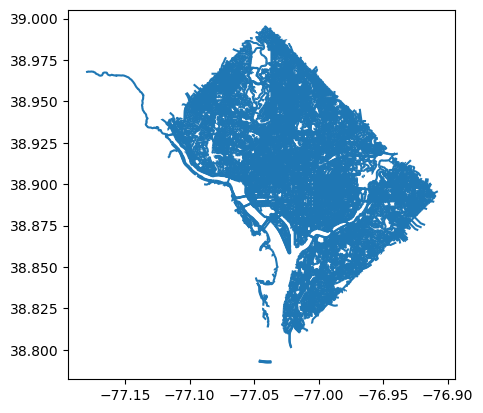

In [21]:
#https://gis.stackexchange.com/questions/360344/finding-where-line-intersects-itself-with-python
from shapely.ops import linemerge
#potentially gets rid of disconnected roads?
#separate out roads at intersections

lm = gpd.GeoDataFrame({'id':[0]}, crs=highways.crs, geometry=[linemerge(all_roads)]).explode().reset_index(drop=True)
print(len(lm))
lm.plot()

In [22]:
#sanity check
l = linemerge(all_roads)
print(len(l.geoms))
print(l.geoms[0])
print(len(lm))
print(lm['geometry'][0])

62612
LINESTRING (-77.1803528 38.9677285, -77.1801353 38.9677697, -77.1795814 38.9678017, -77.179175 38.9678594, -77.1790019 38.9678825, -77.1788905 38.9679584, -77.1787826 38.9680296, -77.1787024 38.9680482, -77.1783328 38.9680054, -77.178022 38.9679683, -77.1776891 38.967972, -77.177232 38.967979, -77.1769407 38.9679866, -77.1761012 38.9680471, -77.1758705 38.9680513, -77.1755433 38.967972, -77.1751839 38.9679512, -77.1749425 38.9679053, -77.1747923 38.967922, -77.1746314 38.9679261, -77.1745509 38.9679053, -77.1744597 38.9678344, -77.1743256 38.9677176, -77.1742183 38.9676717, -77.174052 38.9676175, -77.1738213 38.9675466, -77.1736229 38.9675257, -77.1734512 38.9674507, -77.1732634 38.9673422, -77.1730435 38.9672004, -77.1729469 38.9670544, -77.172847 38.966865, -77.1727872 38.9667929, -77.1723193 38.9666665, -77.1719599 38.9665247, -77.1717721 38.9664455, -77.1714234 38.9663329, -77.1711284 38.9662536, -77.1708387 38.9661702, -77.1706402 38.9660451, -77.17049 38.9659116, -77.170302

In [23]:
lm['SegID'] = range(len(lm))
lm

,id,geometry,SegID
0,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",0
1,0,"LINESTRING (-77.1179 38.93696, -77.118 38.9370...",1
2,0,"LINESTRING (-77.11773 38.92926, -77.11753 38.9...",2
3,0,"LINESTRING (-77.1179 38.93696, -77.11792 38.93...",3
4,0,"LINESTRING (-77.11578 38.9352, -77.116 38.9354...",4
...,...,...,...
62607,0,"LINESTRING (-77.03086 38.88269, -77.03088 38.8...",62607
62608,0,"LINESTRING (-77.0234 38.89786, -77.02338 38.89...",62608
62609,0,"LINESTRING (-77.02291 38.89813, -77.02282 38.8...",62609
62610,0,"LINESTRING (-77.0229 38.89768, -77.02285 38.89...",62610


In [24]:
lm.to_file(r'..\line_merge.geojson')
#this should be our edges? (road segments between intersections)

In [25]:
#helper functions for link above to get start and end points
def get_endpoints(gdf):
    startpoint = gdf.geometry.apply(lambda x: x.coords[0])
    endpoint = gdf.geometry.apply(lambda x: x.coords[-1])

    startpoints = [Point(i) for i in startpoint]
    endpoints = [Point(i) for i in endpoint]

    return startpoints, endpoints

def create_endpoints(startpoints, endpoints, lm):
    geom = []
    for a,b in zip(startpoints, endpoints):
        geom.append(a)
        geom.append(b)

    endpoints = gpd.GeoDataFrame({'PointID': range(0, len(geom))}, crs=lm.crs, geometry=geom)
    return endpoints

<Axes: >

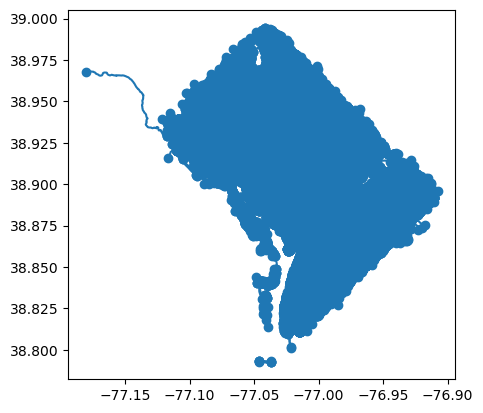

In [26]:
startpoints, endpoints = get_endpoints(lm)
endpoints_singleList = create_endpoints(startpoints, endpoints, lm)

fig, ax = plt.subplots()
highways.plot(ax=ax)
endpoints_singleList.plot(ax=ax)

In [27]:
#this is our list of intersections
endpoints_singleList.to_file(r'..\osm_highway_limited_nodes.geojson')

Now we need to attach the intersections to the roads. We will then have edges (road segments) and nodes (intersections) ready for graph analysis!

In [28]:
endpoints_singleList['geometry'] = endpoints_singleList['geometry'].normalize()
endpoints_cleaned = endpoints_singleList.drop_duplicates(subset=['geometry'])
endpoints_cleaned

,PointID,geometry
0,0,POINT (-77.18035 38.96773)
1,1,POINT (-77.08286 38.90228)
2,2,POINT (-77.1179 38.93696)
3,3,POINT (-77.12172 38.9394)
4,4,POINT (-77.11773 38.92926)
...,...,...
125214,125214,POINT (-77.03086 38.88269)
125216,125216,POINT (-77.0234 38.89786)
125218,125218,POINT (-77.02291 38.89813)
125220,125220,POINT (-77.0229 38.89768)


In [29]:
endpoints_cleaned.to_file(r'..\osm_highway_limited_nodes_cleaned.geojson')

In [30]:
#Get IDs for endpoints
lm['startPoints'] = startpoints
lm['startPoints'] = gpd.GeoSeries(lm['startPoints']).normalize()
lm['endPoints'] = endpoints
lm['endPoints'] = gpd.GeoSeries(lm['endPoints']).normalize()
lm

,id,geometry,SegID,startPoints,endPoints
0,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",0,POINT (-77.18035 38.96773),POINT (-77.08286 38.90228)
1,0,"LINESTRING (-77.1179 38.93696, -77.118 38.9370...",1,POINT (-77.1179 38.93696),POINT (-77.12172 38.9394)
2,0,"LINESTRING (-77.11773 38.92926, -77.11753 38.9...",2,POINT (-77.11773 38.92926),POINT (-77.11812 38.93073)
3,0,"LINESTRING (-77.1179 38.93696, -77.11792 38.93...",3,POINT (-77.1179 38.93696),POINT (-77.11618 38.93518)
4,0,"LINESTRING (-77.11578 38.9352, -77.116 38.9354...",4,POINT (-77.11578 38.9352),POINT (-77.1179 38.93696)
...,...,...,...,...,...
62607,0,"LINESTRING (-77.03086 38.88269, -77.03088 38.8...",62607,POINT (-77.03086 38.88269),POINT (-77.03086 38.88269)
62608,0,"LINESTRING (-77.0234 38.89786, -77.02338 38.89...",62608,POINT (-77.0234 38.89786),POINT (-77.0234 38.89786)
62609,0,"LINESTRING (-77.02291 38.89813, -77.02282 38.8...",62609,POINT (-77.02291 38.89813),POINT (-77.02291 38.89813)
62610,0,"LINESTRING (-77.0229 38.89768, -77.02285 38.89...",62610,POINT (-77.0229 38.89768),POINT (-77.0229 38.89768)


In [31]:
merged_start = pd.merge(lm, endpoints_cleaned, left_on='startPoints', right_on = 'geometry', how='left', suffixes = ['_seg', '_start'])
merged_start = merged_start.rename(columns = {'PointID':'PointID_start'})
merged_start

,id,geometry_seg,SegID,startPoints,endPoints,PointID_start,geometry_start
0,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",0,POINT (-77.18035 38.96773),POINT (-77.08286 38.90228),0,POINT (-77.18035 38.96773)
1,0,"LINESTRING (-77.1179 38.93696, -77.118 38.9370...",1,POINT (-77.1179 38.93696),POINT (-77.12172 38.9394),2,POINT (-77.1179 38.93696)
2,0,"LINESTRING (-77.11773 38.92926, -77.11753 38.9...",2,POINT (-77.11773 38.92926),POINT (-77.11812 38.93073),4,POINT (-77.11773 38.92926)
3,0,"LINESTRING (-77.1179 38.93696, -77.11792 38.93...",3,POINT (-77.1179 38.93696),POINT (-77.11618 38.93518),2,POINT (-77.1179 38.93696)
4,0,"LINESTRING (-77.11578 38.9352, -77.116 38.9354...",4,POINT (-77.11578 38.9352),POINT (-77.1179 38.93696),8,POINT (-77.11578 38.9352)
...,...,...,...,...,...,...,...
62607,0,"LINESTRING (-77.03086 38.88269, -77.03088 38.8...",62607,POINT (-77.03086 38.88269),POINT (-77.03086 38.88269),125214,POINT (-77.03086 38.88269)
62608,0,"LINESTRING (-77.0234 38.89786, -77.02338 38.89...",62608,POINT (-77.0234 38.89786),POINT (-77.0234 38.89786),125216,POINT (-77.0234 38.89786)
62609,0,"LINESTRING (-77.02291 38.89813, -77.02282 38.8...",62609,POINT (-77.02291 38.89813),POINT (-77.02291 38.89813),125218,POINT (-77.02291 38.89813)
62610,0,"LINESTRING (-77.0229 38.89768, -77.02285 38.89...",62610,POINT (-77.0229 38.89768),POINT (-77.0229 38.89768),125220,POINT (-77.0229 38.89768)


In [32]:
merged_end = pd.merge(merged_start, endpoints_cleaned, left_on='endPoints', right_on = 'geometry', how='left', suffixes = ['_seg', '_end'])
merged_end = merged_end.rename(columns = {'PointID':'PointID_end', 'geometry':'geometry_end'})
seg_nodes = merged_end
seg_nodes

,id,geometry_seg,SegID,startPoints,endPoints,PointID_start,geometry_start,PointID_end,geometry_end
0,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",0,POINT (-77.18035 38.96773),POINT (-77.08286 38.90228),0,POINT (-77.18035 38.96773),1,POINT (-77.08286 38.90228)
1,0,"LINESTRING (-77.1179 38.93696, -77.118 38.9370...",1,POINT (-77.1179 38.93696),POINT (-77.12172 38.9394),2,POINT (-77.1179 38.93696),3,POINT (-77.12172 38.9394)
2,0,"LINESTRING (-77.11773 38.92926, -77.11753 38.9...",2,POINT (-77.11773 38.92926),POINT (-77.11812 38.93073),4,POINT (-77.11773 38.92926),5,POINT (-77.11812 38.93073)
3,0,"LINESTRING (-77.1179 38.93696, -77.11792 38.93...",3,POINT (-77.1179 38.93696),POINT (-77.11618 38.93518),2,POINT (-77.1179 38.93696),7,POINT (-77.11618 38.93518)
4,0,"LINESTRING (-77.11578 38.9352, -77.116 38.9354...",4,POINT (-77.11578 38.9352),POINT (-77.1179 38.93696),8,POINT (-77.11578 38.9352),2,POINT (-77.1179 38.93696)
...,...,...,...,...,...,...,...,...,...
62607,0,"LINESTRING (-77.03086 38.88269, -77.03088 38.8...",62607,POINT (-77.03086 38.88269),POINT (-77.03086 38.88269),125214,POINT (-77.03086 38.88269),125214,POINT (-77.03086 38.88269)
62608,0,"LINESTRING (-77.0234 38.89786, -77.02338 38.89...",62608,POINT (-77.0234 38.89786),POINT (-77.0234 38.89786),125216,POINT (-77.0234 38.89786),125216,POINT (-77.0234 38.89786)
62609,0,"LINESTRING (-77.02291 38.89813, -77.02282 38.8...",62609,POINT (-77.02291 38.89813),POINT (-77.02291 38.89813),125218,POINT (-77.02291 38.89813),125218,POINT (-77.02291 38.89813)
62610,0,"LINESTRING (-77.0229 38.89768, -77.02285 38.89...",62610,POINT (-77.0229 38.89768),POINT (-77.0229 38.89768),125220,POINT (-77.0229 38.89768),125220,POINT (-77.0229 38.89768)


In [33]:
for col in ['startPoints', 'endPoints', 'geometry_start','geometry_end']:
    seg_nodes[col] = seg_nodes[col].to_wkt()
seg_nodes

,id,geometry_seg,SegID,startPoints,endPoints,PointID_start,geometry_start,PointID_end,geometry_end
0,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",0,POINT (-77.180353 38.967728),POINT (-77.082863 38.902279),0,POINT (-77.180353 38.967728),1,POINT (-77.082863 38.902279)
1,0,"LINESTRING (-77.1179 38.93696, -77.118 38.9370...",1,POINT (-77.117895 38.93696),POINT (-77.121719 38.939401),2,POINT (-77.117895 38.93696),3,POINT (-77.121719 38.939401)
2,0,"LINESTRING (-77.11773 38.92926, -77.11753 38.9...",2,POINT (-77.117725 38.92926),POINT (-77.118124 38.930734),4,POINT (-77.117725 38.92926),5,POINT (-77.118124 38.930734)
3,0,"LINESTRING (-77.1179 38.93696, -77.11792 38.93...",3,POINT (-77.117895 38.93696),POINT (-77.11618 38.935177),2,POINT (-77.117895 38.93696),7,POINT (-77.11618 38.935177)
4,0,"LINESTRING (-77.11578 38.9352, -77.116 38.9354...",4,POINT (-77.115779 38.935197),POINT (-77.117895 38.93696),8,POINT (-77.115779 38.935197),2,POINT (-77.117895 38.93696)
...,...,...,...,...,...,...,...,...,...
62607,0,"LINESTRING (-77.03086 38.88269, -77.03088 38.8...",62607,POINT (-77.030862 38.882691),POINT (-77.030862 38.882691),125214,POINT (-77.030862 38.882691),125214,POINT (-77.030862 38.882691)
62608,0,"LINESTRING (-77.0234 38.89786, -77.02338 38.89...",62608,POINT (-77.023401 38.897861),POINT (-77.023401 38.897861),125216,POINT (-77.023401 38.897861),125216,POINT (-77.023401 38.897861)
62609,0,"LINESTRING (-77.02291 38.89813, -77.02282 38.8...",62609,POINT (-77.022906 38.898133),POINT (-77.022906 38.898133),125218,POINT (-77.022906 38.898133),125218,POINT (-77.022906 38.898133)
62610,0,"LINESTRING (-77.0229 38.89768, -77.02285 38.89...",62610,POINT (-77.022896 38.897678),POINT (-77.022896 38.897678),125220,POINT (-77.022896 38.897678),125220,POINT (-77.022896 38.897678)


In [34]:
seg_nodes.rename(columns = {'geometry_seg': 'geometry'})

,id,geometry,SegID,startPoints,endPoints,PointID_start,geometry_start,PointID_end,geometry_end
0,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",0,POINT (-77.180353 38.967728),POINT (-77.082863 38.902279),0,POINT (-77.180353 38.967728),1,POINT (-77.082863 38.902279)
1,0,"LINESTRING (-77.1179 38.93696, -77.118 38.9370...",1,POINT (-77.117895 38.93696),POINT (-77.121719 38.939401),2,POINT (-77.117895 38.93696),3,POINT (-77.121719 38.939401)
2,0,"LINESTRING (-77.11773 38.92926, -77.11753 38.9...",2,POINT (-77.117725 38.92926),POINT (-77.118124 38.930734),4,POINT (-77.117725 38.92926),5,POINT (-77.118124 38.930734)
3,0,"LINESTRING (-77.1179 38.93696, -77.11792 38.93...",3,POINT (-77.117895 38.93696),POINT (-77.11618 38.935177),2,POINT (-77.117895 38.93696),7,POINT (-77.11618 38.935177)
4,0,"LINESTRING (-77.11578 38.9352, -77.116 38.9354...",4,POINT (-77.115779 38.935197),POINT (-77.117895 38.93696),8,POINT (-77.115779 38.935197),2,POINT (-77.117895 38.93696)
...,...,...,...,...,...,...,...,...,...
62607,0,"LINESTRING (-77.03086 38.88269, -77.03088 38.8...",62607,POINT (-77.030862 38.882691),POINT (-77.030862 38.882691),125214,POINT (-77.030862 38.882691),125214,POINT (-77.030862 38.882691)
62608,0,"LINESTRING (-77.0234 38.89786, -77.02338 38.89...",62608,POINT (-77.023401 38.897861),POINT (-77.023401 38.897861),125216,POINT (-77.023401 38.897861),125216,POINT (-77.023401 38.897861)
62609,0,"LINESTRING (-77.02291 38.89813, -77.02282 38.8...",62609,POINT (-77.022906 38.898133),POINT (-77.022906 38.898133),125218,POINT (-77.022906 38.898133),125218,POINT (-77.022906 38.898133)
62610,0,"LINESTRING (-77.0229 38.89768, -77.02285 38.89...",62610,POINT (-77.022896 38.897678),POINT (-77.022896 38.897678),125220,POINT (-77.022896 38.897678),125220,POINT (-77.022896 38.897678)


In [35]:
seg_nodes.to_file(r'../seg_nodes.geojson')